## Part1: Acoustic Perception

In this exercise, we would explore two approaches to extract feature representations from speech: Signal processing with Mel-scaled Spectrogram and Deep Learning with Wav2Vec2.

In [60]:
# Download the dataset
!pip install --upgrade datasets fsspec transformers

  Using cached fsspec-2025.5.0-py3-none-any.whl.metadata (11 kB)


In [61]:
from datasets import load_dataset
dataset = load_dataset("hf-internal-testing/librispeech_asr_demo", "clean", split="validation")

In [62]:
# What features the dataset have
print(dataset)

Dataset({
    features: ['file', 'audio', 'text', 'speaker_id', 'chapter_id', 'id'],
    num_rows: 73
})


In [63]:
# Check the sample
dataset[0]

{'file': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/b4d8c39110b7503324cb12b1fc45eb98af56216dfebbfb9dffc303cdc4fd8206/dev_clean/1272/128104/1272-128104-0000.flac',
 'audio': {'path': '/home/jovyan/.cache/huggingface/datasets/downloads/extracted/b4d8c39110b7503324cb12b1fc45eb98af56216dfebbfb9dffc303cdc4fd8206/dev_clean/1272/128104/1272-128104-0000.flac',
  'array': array([0.00238037, 0.0020752 , 0.00198364, ..., 0.00042725, 0.00057983,
         0.0010376 ]),
  'sampling_rate': 16000},
 'text': 'MISTER QUILTER IS THE APOSTLE OF THE MIDDLE CLASSES AND WE ARE GLAD TO WELCOME HIS GOSPEL',
 'speaker_id': 1272,
 'chapter_id': 128104,
 'id': '1272-128104-0000'}

In [64]:
# Play the audio
import IPython.display as ipd
audio_sample = dataset[2]
print(audio_sample["text"].lower())

sampling_rate= audio_sample['audio']['sampling_rate'] # How to get the sampling rate?

ipd.Audio(data=audio_sample["audio"]["array"], autoplay=True, rate=sampling_rate)

he tells us that at this festive season of the year with christmas and roast beef looming before us similes drawn from eating and its results occur most readily to the mind


### Mel-scaled Spectrogram

In [65]:
import librosa # It should be pre-installed with colab; otherwise: !pip install librosa

y, sr = audio_sample['audio']['array'], sampling_rate

In [66]:
# Passing through arguments to the Mel filters
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,
                                    fmax=8000)

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

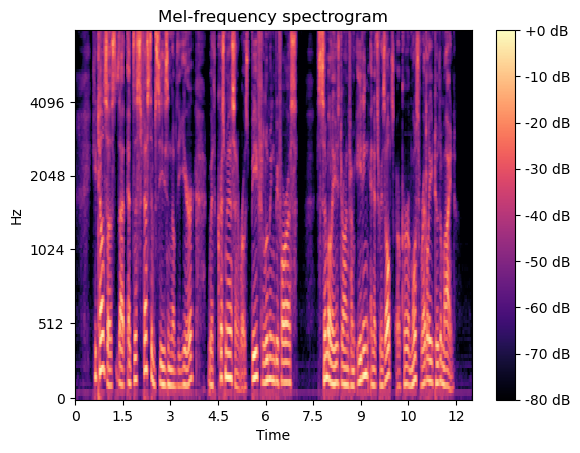

In [67]:
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max) #Convert a power spectrogram (amplitude squared) to decibel (dB) units
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

### Wav2vec2

Now we are going to explore the deep-learning approach. In this exercise we would use the SOTA self-supervised model Wav2vec2 and perform speech recognition.

We would use the pre-trained Wav2vec2 model from Huggingface and the documentation is https://huggingface.co/docs/transformers/model_doc/wav2vec2#wav2vec2.

<img src="https://mohitmayank.com/a_lazy_data_science_guide/imgs/audio_wav2vec2_arch.png" width="500">


In [68]:
# Here we are going to use a model that is already trained to perform ASR tasks
# Model is CTC-based and the vocab is at character level.

from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC

processor_asr = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-100h") # For input preparation and tokenization
model_asr = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-100h") # Fine-tuned with 100h English ASR dataset

Some weights of the model checkpoint at facebook/wav2vec2-base-100h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.mask_time_emb_vector']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-100h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [80]:
# What is the vocabulary?
vocab=processor_asr.tokenizer.get_vocab()
print(vocab)

# <pad> corresponds to CTC's "blank token" and '|' correspond to the space as the new one is more visible

print('Vocab size: ', processor_asr.tokenizer.vocab_size)

{"'": 27, '</s>': 2, '<pad>': 0, '<s>': 1, '<unk>': 3, 'A': 7, 'B': 24, 'C': 19, 'D': 14, 'E': 5, 'F': 20, 'G': 21, 'H': 11, 'I': 10, 'J': 29, 'K': 26, 'L': 15, 'M': 17, 'N': 9, 'O': 8, 'P': 23, 'Q': 30, 'R': 13, 'S': 12, 'T': 6, 'U': 16, 'V': 25, 'W': 18, 'X': 28, 'Y': 22, 'Z': 31, '|': 4}
Vocab size:  32


In [70]:
# Prepare inputs as the required format by the model
inputs = processor_asr(audio_sample["audio"]["array"], sampling_rate=sampling_rate, return_tensors="pt")
print(inputs['input_values'].shape)

torch.Size([1, 199760])


In [71]:
# Inference
import torch

outputs = model_asr(**inputs)
logits= outputs.logits # Prediction scores over the vocabulary

In [72]:
logits.shape

torch.Size([1, 624, 32])

In [81]:
# Now we select the char in the vocab that has the highest probability as the predicted id. Note that this is autoencoder not autoregressive
predicted_ids = torch.argmax(logits, dim=-1)

print(predicted_ids.shape)

torch.Size([1, 624])


In [74]:
#Let's convert ids to tokens with a pre-defined function
# Source: https://github.com/huggingface/transformers/blob/4fdf58afb72b0754da30037fc800b6044e7d9c99/src/transformers/tokenization_utils.py#L953

id2tokens=processor_asr.tokenizer.convert_ids_to_tokens(predicted_ids[0])

In [75]:
print(len(id2tokens))
print(id2tokens[:50])

624
['<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', 'H', 'H', 'E', 'E', '|', '|', '<pad>', 'T', 'T', '<pad>', 'E', 'L', '<pad>', '<pad>', '<pad>', 'L', '<pad>', 'S', 'S', '<pad>', '|']


In [76]:
# Remove the <pad> with skip_special_tokens

print(processor_asr.tokenizer.convert_ids_to_tokens(predicted_ids[0], skip_special_tokens=True))

['H', 'H', 'E', 'E', '|', '|', 'T', 'T', 'E', 'L', 'L', 'S', 'S', '|', '|', 'U', 'S', 'S', '|', '|', 'T', 'T', 'H', 'H', 'A', 'T', 'T', '|', '|', 'A', 'T', '|', '|', 'T', 'H', 'H', 'I', 'I', 'S', 'S', '|', '|', 'F', 'E', 'S', 'S', 'T', 'I', 'V', 'V', 'E', '|', '|', 'S', 'E', 'E', 'A', 'A', 'S', 'O', 'O', 'N', 'N', '|', '|', 'O', 'O', 'F', '|', '|', '|', 'T', 'H', 'E', '|', '|', 'Y', 'Y', 'E', 'E', 'A', 'A', 'R', 'R', 'R', '|', '|', '|', 'W', 'W', 'I', 'T', 'H', 'H', '|', '|', 'C', 'H', 'R', 'R', 'I', 'S', 'T', 'T', 'M', 'A', 'A', 'U', 'S', 'S', '|', '|', 'A', 'N', 'D', '|', '|', 'R', 'R', 'O', 'S', 'E', '|', 'B', 'E', 'E', 'F', 'F', '|', '|', 'L', 'O', 'O', 'M', 'I', 'N', 'G', 'G', '|', '|', 'B', 'E', 'E', 'F', 'F', 'O', 'R', 'R', 'E', 'E', '|', '|', '|', 'U', 'U', 'S', 'S', '|', '|', 'S', 'I', 'M', 'M', 'A', 'L', 'L', 'Y', 'I', 'S', 'S', '|', 'D', 'R', 'R', 'A', 'W', 'W', 'N', '|', '|', 'F', 'R', 'R', 'O', 'M', '|', '|', 'E', 'E', 'A', 'A', 'T', 'I', 'I', 'N', 'G', 'G', '|', '|', 'A',

Recall: convert the tokens as a string with CTC


*   Merge Repeated characters
*   Remove blank



<img src="https://distill.pub/2017/ctc/assets/ctc_alignment_steps.svg">

In [77]:
# Convert the tokens as a string
# Source: https://github.com/huggingface/transformers/blob/4fdf58afb72b0754da30037fc800b6044e7d9c99/src/transformers/models/wav2vec2/tokenization_wav2vec2.py#L285

transcription = processor_asr.tokenizer.convert_tokens_to_string(id2tokens)['text']
print(transcription)
print(transcription.lower()) # Why the original prediction is capitalized?
print(audio_sample["text"].lower())

HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAUS AND ROSE BEEF LOOMING BEFORE US SIMALYIS DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND
he tells us that at this festive season of the year with christmaus and rose beef looming before us simalyis drawn from eating and its results occur most readily to the mind
he tells us that at this festive season of the year with christmas and roast beef looming before us similes drawn from eating and its results occur most readily to the mind


In [78]:
# All-in-one function: batch_decode()
# Source: https://github.com/huggingface/transformers/blob/4fdf58afb72b0754da30037fc800b6044e7d9c99/src/transformers/models/wav2vec2/tokenization_wav2vec2.py#L458

generation=processor_asr.batch_decode(predicted_ids, output_char_offsets=True, output_word_offsets=True)

for key, value in generation.items():
  print(f'key: {key}')
  print(f'value: {value}')

key: text
value: ['HE TELLS US THAT AT THIS FESTIVE SEASON OF THE YEAR WITH CHRISTMAUS AND ROSE BEEF LOOMING BEFORE US SIMALYIS DRAWN FROM EATING AND ITS RESULTS OCCUR MOST READILY TO THE MIND']
key: char_offsets
value: [[{'char': 'H', 'start_offset': 29, 'end_offset': 31}, {'char': 'E', 'start_offset': 31, 'end_offset': 33}, {'char': ' ', 'start_offset': 33, 'end_offset': 35}, {'char': 'T', 'start_offset': 36, 'end_offset': 38}, {'char': 'E', 'start_offset': 39, 'end_offset': 40}, {'char': 'L', 'start_offset': 40, 'end_offset': 41}, {'char': 'L', 'start_offset': 44, 'end_offset': 45}, {'char': 'S', 'start_offset': 46, 'end_offset': 48}, {'char': ' ', 'start_offset': 49, 'end_offset': 51}, {'char': 'U', 'start_offset': 55, 'end_offset': 56}, {'char': 'S', 'start_offset': 57, 'end_offset': 59}, {'char': ' ', 'start_offset': 59, 'end_offset': 61}, {'char': 'T', 'start_offset': 68, 'end_offset': 70}, {'char': 'H', 'start_offset': 70, 'end_offset': 72}, {'char': 'A', 'start_offset': 73, 'e

**Question How to convert offset to duration in second?**

In [79]:
inputs_to_logits_ratio = model_asr.config.inputs_to_logits_ratio # Determined by model architecture
sampling_rate = processor_asr.feature_extractor.sampling_rate
time_offset =  inputs_to_logits_ratio/sampling_rate # The duration of one logit in second


for result_word in generation['word_offsets'][0]:
  the_word = result_word['word']
  start_time = round(result_word['start_offset'] * time_offset, 2)
  end_time = round(result_word['end_offset'] * time_offset, 2)

  print(f'{the_word}: {start_time}s - {end_time}s')

HE: 0.58s - 0.66s
TELLS: 0.72s - 0.96s
US: 1.1s - 1.18s
THAT: 1.36s - 1.54s
AT: 1.68s - 1.74s
THIS: 1.82s - 1.98s
FESTIVE: 2.14s - 2.5s
SEASON: 2.6s - 2.98s
OF: 3.1s - 3.16s
THE: 3.22s - 3.3s
YEAR: 3.38s - 3.6s
WITH: 4.22s - 4.38s
CHRISTMAUS: 4.5s - 5.0s
AND: 5.06s - 5.14s
ROSE: 5.22s - 5.44s
BEEF: 5.58s - 5.8s
LOOMING: 5.94s - 6.24s
BEFORE: 6.32s - 6.64s
US: 6.74s - 6.82s
SIMALYIS: 7.78s - 8.3s
DRAWN: 8.36s - 8.56s
FROM: 8.64s - 8.76s
EATING: 8.92s - 9.18s
AND: 9.32s - 9.4s
ITS: 9.44s - 9.56s
RESULTS: 9.62s - 10.0s
OCCUR: 10.2s - 10.46s
MOST: 10.6s - 10.8s
READILY: 10.9s - 11.22s
TO: 11.34s - 11.42s
THE: 11.5s - 11.56s
MIND: 11.62s - 11.88s


## Part2: Multimodal Perception

In this exercise, we are going to explore a vision-language by performing a Visual Question Answering (VQA) task. VQA is the task of answering open-ended questions based on an image. The input to models supporting this task is typically a combination of an image and a question, and the output is an answer expressed in natural language. Reference: https://huggingface.co/docs/transformers/tasks/visual_question_answering


Here we are going to use the BLIP model from Salesforce Research. The BLIP model was proposed in *BLIP: Bootstrapping Language-Image Pre-training for Unified Vision-Language Understanding and Generation* by Junnan Li, Dongxu Li, Caiming Xiong, Steven Hoi.





<img src="https://miro.medium.com/v2/resize:fit:1160/1*9gzL-3ikQNKgyaN1X9ZFuw.png" width="500">

BLIP is a model that is able to perform various multi-modal tasks including:

* Visual Question Answering
* Image-Text retrieval (Image-text matching)
* Image Captioning






In [82]:
# Download the model
import requests
from PIL import Image
from transformers import BlipProcessor, BlipForQuestionAnswering

# Download the processor and model
processor_mp = BlipProcessor.from_pretrained("Salesforce/blip-vqa-base")
model_mp = BlipForQuestionAnswering.from_pretrained("Salesforce/blip-vqa-base")



Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

In [83]:
# What are the components of the model?
print(model_mp)

BlipForQuestionAnswering(
  (vision_model): BlipVisionModel(
    (embeddings): BlipVisionEmbeddings(
      (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (encoder): BlipEncoder(
      (layers): ModuleList(
        (0-11): 12 x BlipEncoderLayer(
          (self_attn): BlipAttention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=768, out_features=2304, bias=True)
            (projection): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): BlipMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((768,), eps=1e-05, e

Show the image


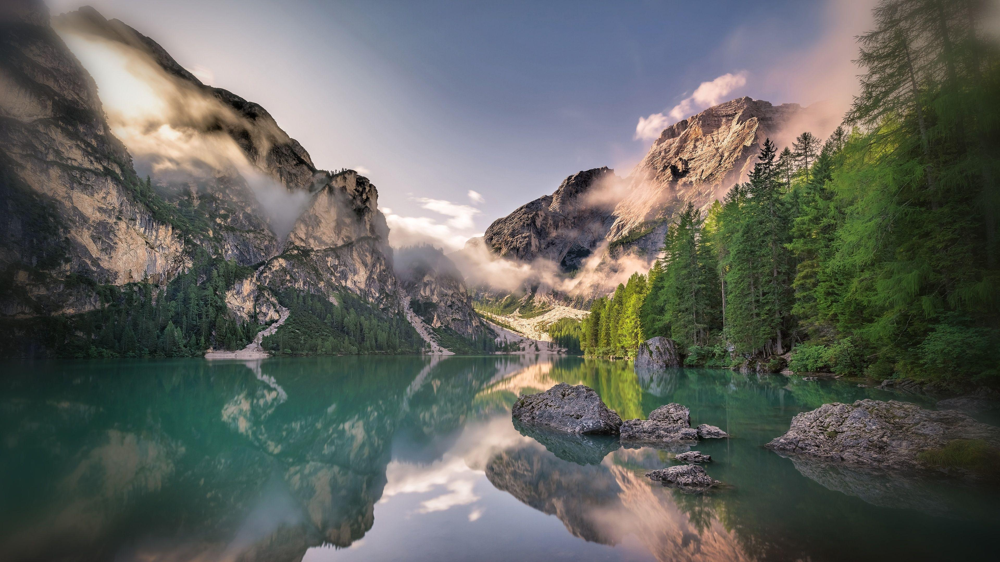

In [100]:
img_url = 'https://wallpaperaccess.com/full/2416000.jpg'
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')

print('Show the image')
raw_image


In [85]:
question = "how many dogs are in the picture?"
inputs = processor_mp(raw_image, question, return_tensors="pt")

# What are the inputs to the model?
print(inputs.keys())

dict_keys(['pixel_values', 'input_ids', 'attention_mask'])


In [86]:
# How fast?
import datetime
print(datetime.datetime.now())
out = model_mp.generate(**inputs)
print('Answer: ', processor_mp.decode(out[0], skip_special_tokens=True))
print(datetime.datetime.now())

2025-05-24 12:17:16.775643
Answer:  1
2025-05-24 12:17:20.560970


In [99]:
question = "what do you see in"
inputs = processor_mp(raw_image, question, return_tensors="pt")

print(datetime.datetime.now())
out = model_mp.generate(**inputs)
print('Answer: ', processor_mp.decode(out[0], skip_special_tokens=True))
print(datetime.datetime.now())

2025-05-24 12:25:04.299773
Answer:  lab
2025-05-24 12:25:08.285965
